In [57]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


In [59]:
device

device(type='cpu')

In [61]:
img= torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


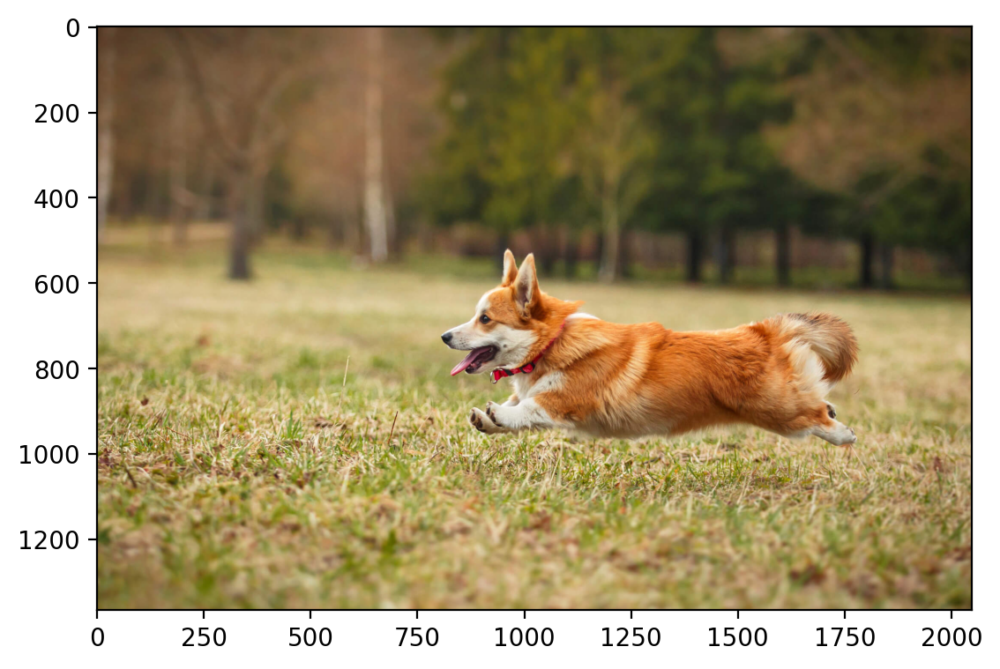

In [63]:
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())

In [65]:
from sklearn import preprocessing

scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler_img

MinMaxScaler()

In [67]:
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled.shape

img_scaled = torch.tensor(img_scaled)

nan_count = torch.isnan(img_scaled).sum().item()

print(f"Number of NaN values: {nan_count}")

Number of NaN values: 0


In [69]:
img_scaled = img_scaled.to(device)
img_scaled

tensor([[[0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         ...,
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3765, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3804, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3843, 0.3804, 0.3804]],

        [[0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         ...,
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3176, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3216, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3255, 0.3216, 0.3216]],

        [[0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.

In [71]:
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 600, 800, 300, 300)
crop_masked = crop
crop.shape
print(crop)

nan_count = torch.isnan(crop).sum().item()

print(f"Number of NaN values: {nan_count}")

tensor([[[0.7686, 0.7686, 0.7686,  ..., 0.5451, 0.5451, 0.5412],
         [0.7725, 0.7725, 0.7725,  ..., 0.5686, 0.5686, 0.5647],
         [0.7765, 0.7765, 0.7765,  ..., 0.5882, 0.5843, 0.5843],
         ...,
         [0.7961, 0.7373, 0.7176,  ..., 0.5843, 0.5725, 0.5490],
         [0.8471, 0.7843, 0.7451,  ..., 0.6039, 0.5686, 0.5569],
         [0.8784, 0.8196, 0.7686,  ..., 0.6275, 0.5804, 0.5686]],

        [[0.6941, 0.6941, 0.6941,  ..., 0.5137, 0.5137, 0.5098],
         [0.6980, 0.6980, 0.6980,  ..., 0.5255, 0.5255, 0.5216],
         [0.7020, 0.7020, 0.7020,  ..., 0.5451, 0.5412, 0.5412],
         ...,
         [0.7686, 0.7098, 0.6863,  ..., 0.2824, 0.2706, 0.2431],
         [0.8157, 0.7569, 0.7137,  ..., 0.3059, 0.2667, 0.2431],
         [0.8431, 0.7882, 0.7333,  ..., 0.3294, 0.2706, 0.2588]],

        [[0.4745, 0.4745, 0.4745,  ..., 0.3294, 0.3294, 0.3255],
         [0.4784, 0.4784, 0.4784,  ..., 0.3451, 0.3451, 0.3412],
         [0.4824, 0.4824, 0.4824,  ..., 0.3647, 0.3608, 0.

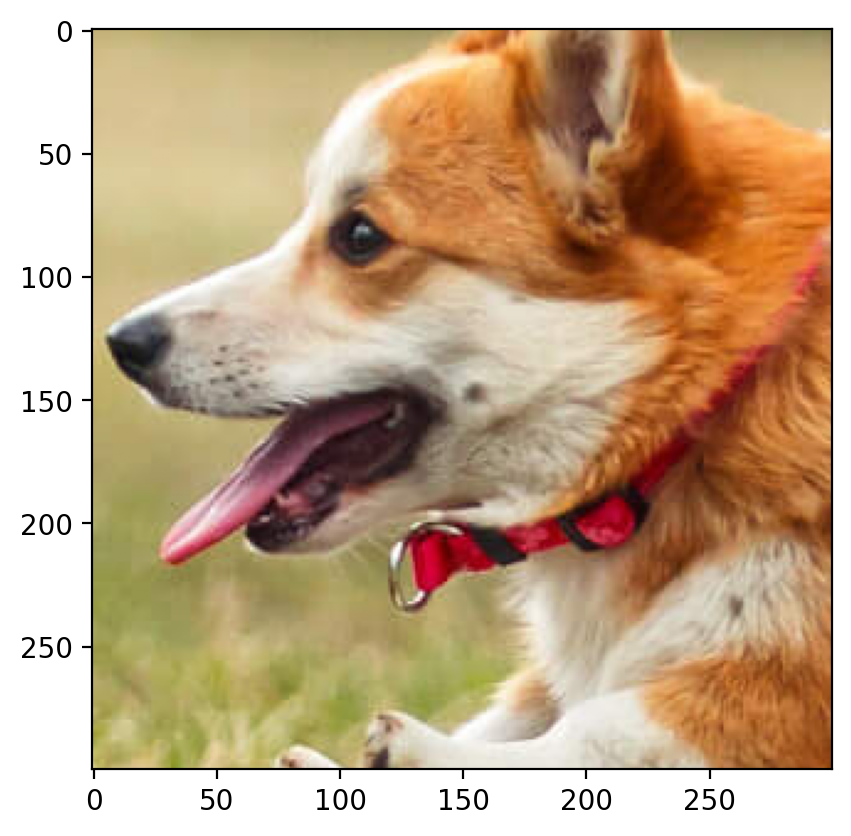

In [73]:
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())

In [75]:
# Modify the loss function to ignore NaN values

def factorize(A, k, device=torch.device("cpu")):
    """Factorize the matrix D into A and B"""
    A = A.to(device)
    # Randomly initialize A and B
    W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A.shape[1], requires_grad=True, device=device)
    # Optimizer
    optimizer = optim.Adam([W, H], lr=0.01)
    mask = ~torch.isnan(A)
    # Train the model
    for i in range(1000):
        # Compute the loss
        diff_matrix = torch.mm(W, H) - A
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)
        
        # Zero the gradients
        optimizer.zero_grad()
        
        # Backpropagate
        loss.backward()
        
        # Update the parameters
        optimizer.step()
        
    return W, H, loss

In [77]:
from sklearn.metrics import mean_squared_error

def plot(original_image, k_values=[5, 10, 25, 50], device='cpu'):
    fig, axs = plt.subplots(1, 1 + len(k_values), figsize=(20, 4.5))
    axs[0].imshow(rearrange(original_image, 'c h w -> h w c').detach().numpy())
    #original_image = original_image.to(device)
    #original_img_np = original_image.cpu().detach().numpy()
    #axs[0].imshow(original_img_np, cmap='gray')
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    matrixr = original_image[0, :, :]  
    matrixg = original_image[1, :, :]  
    matrixb = original_image[2, :, :]  
    
    for i, k in enumerate(k_values):
        Wr, Hr, lossr = factorize(matrixr, k, device=device)
        Wg, Hg, lossg = factorize(matrixg, k, device=device)
        Wb, Hb, lossb = factorize(matrixb, k, device=device)

        reconstructed_img = torch.stack([torch.mm(Wr,Hr), torch.mm(Wg,Hg), torch.mm(Wb,Hb)], dim=0)

        original_flat = original_image.reshape(-1)
        reconstructed_flat = reconstructed_img.reshape(-1)
    
        # Compute the RMSE
        mask = ~torch.isnan(reconstructed_flat) & ~torch.isnan(original_flat)
        mse = torch.mean((original_flat[mask] - reconstructed_flat[mask]) ** 2)  # Mean Squared Error
        rmse = torch.sqrt(mse)  # Root Mean Squared Error
        #rmse = np.sqrt(mean_squared_error(original_image.cpu().detach().numpy(), reconstructed_img.cpu().detach().numpy()))
        psnr = 20 * np.log10(1.0 / rmse.cpu().detach().numpy())
        if rmse == 0:
            psnr = float('inf')              
        #reconstructed_img_np = reconstructed_img.cpu().detach().numpy()
        axs[i + 1].imshow(rearrange(reconstructed_img, 'c h w -> h w c').detach().numpy())
        #axs[i + 1].set_title(f'k={k}, Loss={loss.item():.4f}, RMSE={rmse:.4f}, \n PSNR={psnr:.4f}')
        axs[i + 1].set_title(f'k={k}, Rmse={rmse:.4f}, \n PSNR={psnr:.4f}')
        axs[i + 1].axis('off')

    plt.suptitle('Original and Reconstructed Images for Different k Values')
    plt.tight_layout()
    plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


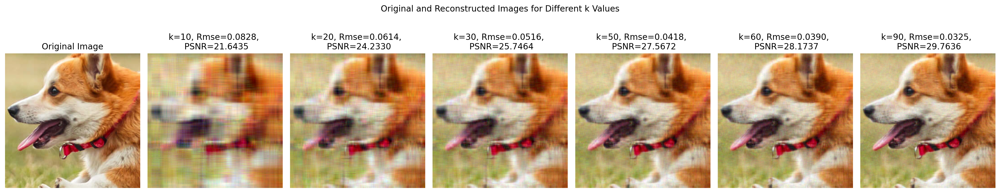

In [79]:
plot(crop, [10,20,30,50,60,90])

In [23]:
crop


tensor([[[0.7686, 0.7686, 0.7686,  ..., 0.5451, 0.5451, 0.5412],
         [0.7725, 0.7725, 0.7725,  ..., 0.5686, 0.5686, 0.5647],
         [0.7765, 0.7765, 0.7765,  ..., 0.5882, 0.5843, 0.5843],
         ...,
         [0.7961, 0.7373, 0.7176,  ..., 0.5843, 0.5725, 0.5490],
         [0.8471, 0.7843, 0.7451,  ..., 0.6039, 0.5686, 0.5569],
         [0.8784, 0.8196, 0.7686,  ..., 0.6275, 0.5804, 0.5686]],

        [[0.6941, 0.6941, 0.6941,  ..., 0.5137, 0.5137, 0.5098],
         [0.6980, 0.6980, 0.6980,  ..., 0.5255, 0.5255, 0.5216],
         [0.7020, 0.7020, 0.7020,  ..., 0.5451, 0.5412, 0.5412],
         ...,
         [0.7686, 0.7098, 0.6863,  ..., 0.2824, 0.2706, 0.2431],
         [0.8157, 0.7569, 0.7137,  ..., 0.3059, 0.2667, 0.2431],
         [0.8431, 0.7882, 0.7333,  ..., 0.3294, 0.2706, 0.2588]],

        [[0.4745, 0.4745, 0.4745,  ..., 0.3294, 0.3294, 0.3255],
         [0.4784, 0.4784, 0.4784,  ..., 0.3451, 0.3451, 0.3412],
         [0.4824, 0.4824, 0.4824,  ..., 0.3647, 0.3608, 0.

In [83]:
import random
x_start, y_start = 50 , 50
# Define the size of the patch
patch_size = 30
print(crop_masked)
# Replace the patch with NaN values
crop_masked[:, x_start:x_start+patch_size, y_start:y_start+patch_size] = float('nan')
print(x_start)
print(crop_masked)

tensor([[[0.7686, 0.7686, 0.7686,  ..., 0.5451, 0.5451, 0.5412],
         [0.7725, 0.7725, 0.7725,  ..., 0.5686, 0.5686, 0.5647],
         [0.7765, 0.7765, 0.7765,  ..., 0.5882, 0.5843, 0.5843],
         ...,
         [0.7961, 0.7373, 0.7176,  ..., 0.5843, 0.5725, 0.5490],
         [0.8471, 0.7843, 0.7451,  ..., 0.6039, 0.5686, 0.5569],
         [0.8784, 0.8196, 0.7686,  ..., 0.6275, 0.5804, 0.5686]],

        [[0.6941, 0.6941, 0.6941,  ..., 0.5137, 0.5137, 0.5098],
         [0.6980, 0.6980, 0.6980,  ..., 0.5255, 0.5255, 0.5216],
         [0.7020, 0.7020, 0.7020,  ..., 0.5451, 0.5412, 0.5412],
         ...,
         [0.7686, 0.7098, 0.6863,  ..., 0.2824, 0.2706, 0.2431],
         [0.8157, 0.7569, 0.7137,  ..., 0.3059, 0.2667, 0.2431],
         [0.8431, 0.7882, 0.7333,  ..., 0.3294, 0.2706, 0.2588]],

        [[0.4745, 0.4745, 0.4745,  ..., 0.3294, 0.3294, 0.3255],
         [0.4784, 0.4784, 0.4784,  ..., 0.3451, 0.3451, 0.3412],
         [0.4824, 0.4824, 0.4824,  ..., 0.3647, 0.3608, 0.

In [27]:
def create_coordinate_map(img):
    """
    img: torch.Tensor of shape (num_channels, height, width)
    
    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """
    
    num_channels, height, width = img.shape
    
    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(width).repeat(height, 1)
    h_coords = torch.arange(height).repeat(width, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Move X to GPU if available
    X = X.to(device)

    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').float()
    return X, Y

In [29]:
img_X, img_Y = create_coordinate_map(crop_masked)

print(img_X.shape) 
print(img_Y.shape)

nan_count = torch.isnan(img_Y).sum().item()

print(f"Number of NaN values: {nan_count}")

torch.Size([90000, 2])
torch.Size([90000, 3])
Number of NaN values: 2700


In [31]:
# MinMaxScaler from -1 to 1
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(img_X.cpu())

# Scale the X coordinates
img_X_scaled = scaler_X.transform(img_X.cpu())

# Move the scaled X coordinates to the GPU
img_X_scaled = torch.tensor(img_X_scaled).to(device)

# Set to dtype float32
img_X_scaled = img_X_scaled.float()

In [33]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)
        
    def forward(self, x):
        return self.linear(x)
    
net = LinearModel(2, 3)
net.to(device)

LinearModel(
  (linear): Linear(in_features=2, out_features=3, bias=True)
)

In [35]:
def train(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3) with some NaN values
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
   
    # Create a mask to ignore NaN values in Y
    mask = ~torch.isnan(Y)

    for epoch in range(epochs):
        optimizer.zero_grad()

        # Get model predictions
        outputs = net(X)

        # Mask the outputs and Y to exclude NaN values
        masked_outputs = outputs[mask]
        masked_Y = Y[mask]

        # Compute the loss only for valid (non-NaN) values
        loss = criterion(masked_outputs, masked_Y)

        # Backpropagation and optimizer step
        loss.backward()
        optimizer.step()

        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")

    return loss.item()

In [37]:
# create RFF features
def create_rff_features(X, num_features, sigma):
    from sklearn.kernel_approximation import RBFSampler
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2))
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)

In [39]:
X_rff = create_rff_features(img_X_scaled, 20000, 0.008)
X_rff.shape

torch.Size([90000, 20000])

In [41]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)
train(net, 0.005, X_rff, img_Y, 2500)

Epoch 0 loss: 0.371175
Epoch 100 loss: 0.053212
Epoch 200 loss: 0.015521
Epoch 300 loss: 0.010063
Epoch 400 loss: 0.007504
Epoch 500 loss: 0.005766
Epoch 600 loss: 0.004501
Epoch 700 loss: 0.003551
Epoch 800 loss: 0.002823
Epoch 900 loss: 0.002259
Epoch 1000 loss: 0.001821
Epoch 1100 loss: 0.001479
Epoch 1200 loss: 0.001213
Epoch 1300 loss: 0.001006
Epoch 1400 loss: 0.000848
Epoch 1500 loss: 0.000726
Epoch 1600 loss: 0.000634
Epoch 1700 loss: 0.000564
Epoch 1800 loss: 0.000512
Epoch 1900 loss: 0.000474
Epoch 2000 loss: 0.000445
Epoch 2100 loss: 0.000424
Epoch 2200 loss: 0.000409
Epoch 2300 loss: 0.000397
Epoch 2400 loss: 0.000389


0.00038253373350016773

In [43]:
def plot_reconstructed_and_original_image(original_img, net, X, title=""):
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    num_channels, height, width = original_img.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        predicted = img_Y.cpu().numpy()
        original = outputs.cpu().numpy()
        rmse = np.sqrt(np.nanmean((predicted - original) ** 2))
        print(rmse)
        psnr = 20 * np.log10(1 / rmse)
        if rmse == 0:
           psnr = float('inf')
        outputs = outputs.reshape(height, width, num_channels)
        #outputs = outputs.permute(1, 2, 0)
    fig = plt.figure(figsize=(6, 5))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])
    
    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.imshow(outputs.cpu())
    ax0.set_title(f"Reconstructed Image\nRMSE: {rmse:.4f} PSNR: {psnr:.4f} dB")

    ax1.imshow(original_img.cpu().permute(1, 2, 0))
    ax1.set_title("Original Image")
    
    for a in [ax0, ax1]:
        a.axis("off")


    fig.suptitle(title, y=0.9)
    plt.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.019557027


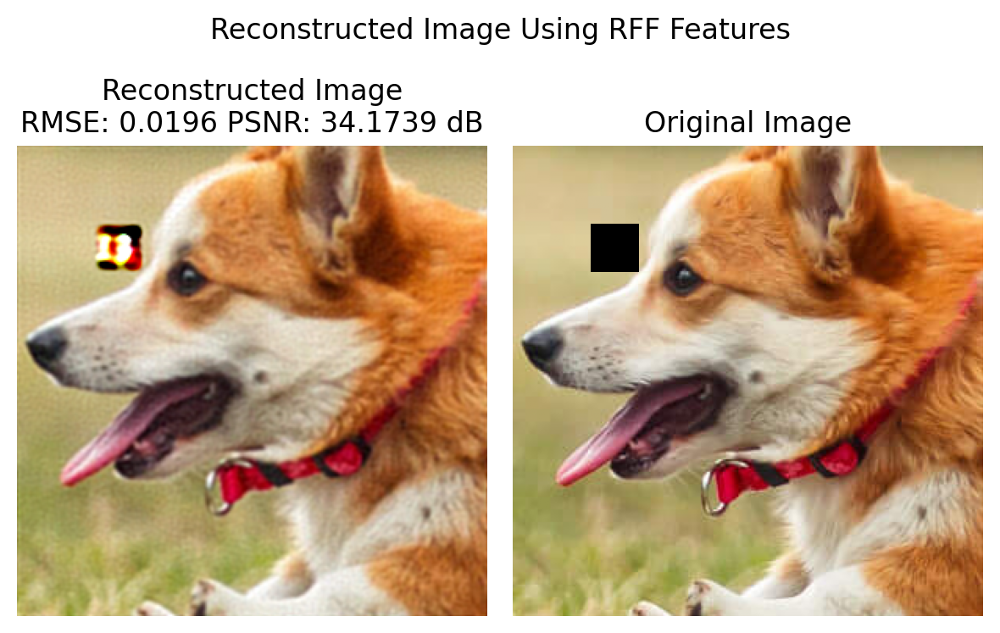

In [47]:
plot_reconstructed_and_original_image(crop, net, X_rff, title="Reconstructed Image Using RFF Features")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


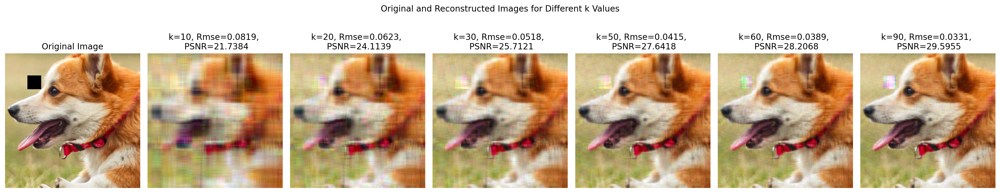

In [55]:
plot(crop_masked, [10,20,30,50,60,90])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


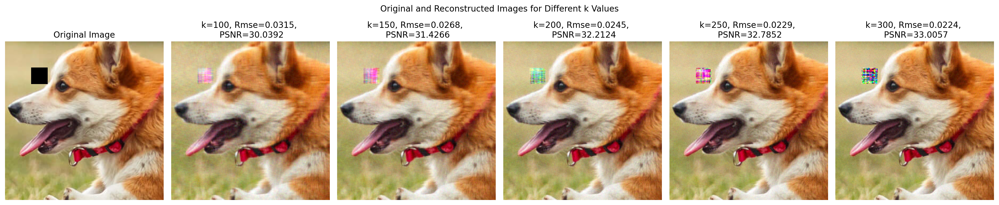

In [85]:
plot(crop_masked, [100,150,200,250,300])